<center>
<h1><b>Lab 11</b></h1>
<h1>PHYS 580 - Computational Physics</h1>
<h2>Professor Molnar</h2>
</br>
<h3><b>Ethan Knox</b></h3>
<h4>https://www.github.com/ethank5149</h4>
<h4>ethank5149@gmail.com</h4>
</br>
</br>
<h3><b>November 12, 2020</b></h3>
<hr>
</center>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('dark_background')

# Problem 1
Use the starter program `ising.py` (or its Matlab version `ising.m` / `calculate_spin.m`) or your own equivalent routines to simulate the Ising ferromagnet in 2D. Do production runs at temperatures $T$ sampled in regular increments both above and below $T_C\approx2.27$ (measured in units of J/kB), for a few different values of the magnetic field $H$ (measured in units of J/$\mu$). Make sure to calculate for $H=0$, as well as positive and negative $H$. For initial conditions, you can try, e.g., having all spins up. Observe and note how the magnetization per spin ($m$) and energy per spin ($E$) converge towards their equilibrium values, as well as the qualitative features of the equilibrium configurations that may be reached. For example, check how the rate of convergence depends on the temperature and/or the field. 

Using code from my [GitHub](https://github.com/ethank5149/IsingModelPhysics) repo on the subject (Stripped down version found below):

In [2]:
# After running `.\IsingModel`
a = np.load('results.npz')['isingmodel']
df = pd.DataFrame(a, columns=['Temperature', 'MagneticField', 'Energy', 'Magnetization', 'SpecificHeatCapacity', 'MagneticSusceptibility'])
df

,Temperature,MagneticField,Energy,Magnetization,SpecificHeatCapacity,MagneticSusceptibility
0,1.500000,0.0,-3.899840,0.985893,0.783993,0.027264
1,1.502002,0.0,-3.904960,0.986933,0.801392,0.026147
2,1.504004,0.0,-3.899058,-0.986151,0.798130,0.026580
3,1.506006,0.0,-3.902969,-0.986462,0.750168,0.027782
4,1.508008,0.0,-3.902329,0.986542,0.721839,0.024825
...,...,...,...,...,...,...
995,3.491992,0.0,-1.344462,0.013209,1.162247,2.146309
996,3.493994,0.0,-1.321209,0.023609,0.987977,1.791802
997,3.495996,0.0,-1.305138,-0.010960,1.059259,1.819019
998,3.497998,0.0,-1.305351,-0.018427,1.052455,1.599211


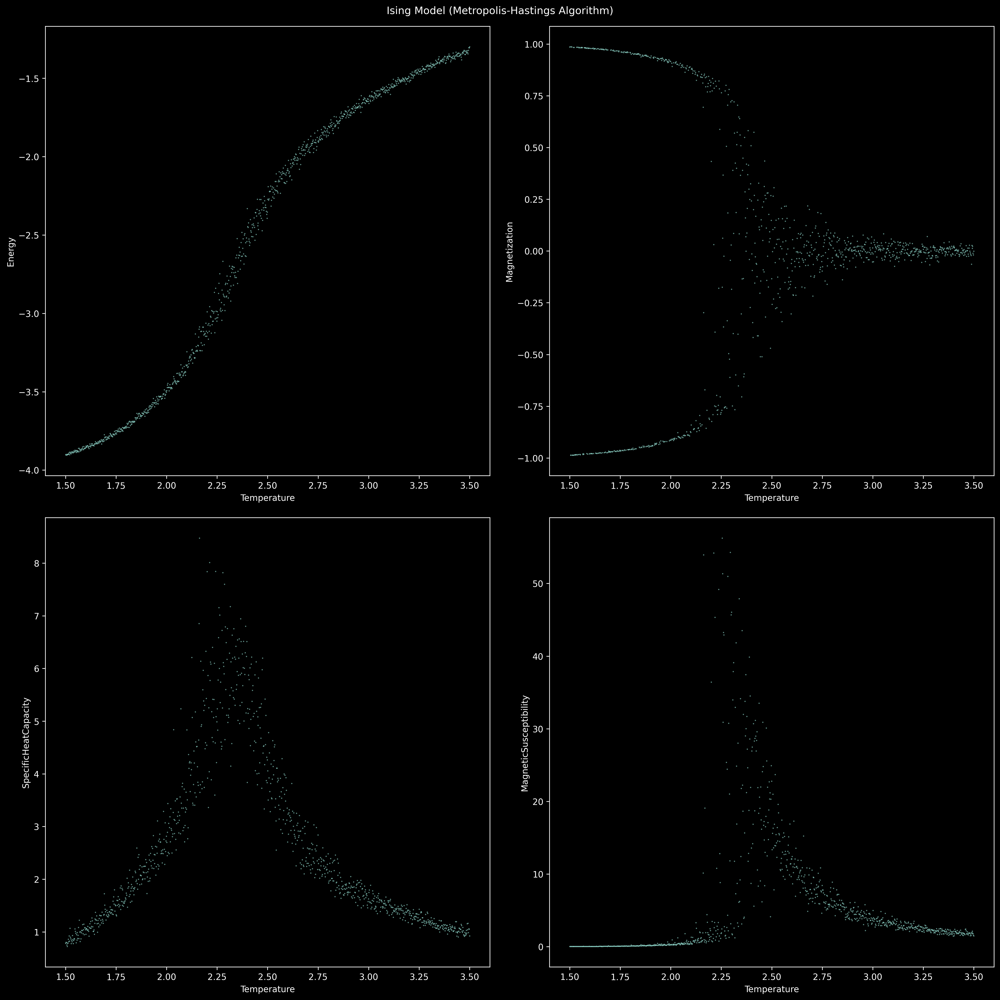

In [3]:
fig, ax = plt.subplots(2,2, figsize=(16, 16), dpi=300, constrained_layout=True)
fig.suptitle('Ising Model (Metropolis-Hastings Algorithm)')
df.plot.scatter('Temperature',                 'Energy', ax=ax[0,0], s=0.1)
df.plot.scatter('Temperature',          'Magnetization', ax=ax[0,1], s=0.1)
df.plot.scatter('Temperature',   'SpecificHeatCapacity', ax=ax[1,0], s=0.1)
df.plot.scatter('Temperature', 'MagneticSusceptibility', ax=ax[1,1], s=0.1)
plt.show()

In [4]:
# After running `.\IsingModel --nH 100 --nT 100 --Hi -10 --Hf 10`
a = np.load('results_3d.npz')['isingmodel']
df = pd.DataFrame(a, columns=['Temperature', 'MagneticField', 'Energy', 'Magnetization', 'SpecificHeatCapacity', 'MagneticSusceptibility'])
df

,Temperature,MagneticField,Energy,Magnetization,SpecificHeatCapacity,MagneticSusceptibility
0,1.5,-10.000000,-14.000000,1.000000,0.000000e+00,0.000000
1,1.5,-9.797980,-13.797980,1.000000,2.359405e-24,0.000000
2,1.5,-9.595960,-13.595960,1.000000,5.308661e-24,0.000000
3,1.5,-9.393939,-13.393939,1.000000,6.903384e-26,0.000000
4,1.5,-9.191919,-13.191919,1.000000,2.680065e-24,0.000000
...,...,...,...,...,...,...
9995,3.5,9.191919,-13.173123,-0.998907,4.884310e-02,0.000578
9996,3.5,9.393939,-13.378942,-0.999138,4.197148e-02,0.000486
9997,3.5,9.595960,-13.582196,-0.999218,3.875758e-02,0.000438
9998,3.5,9.797980,-13.779470,-0.998960,5.576773e-02,0.000616


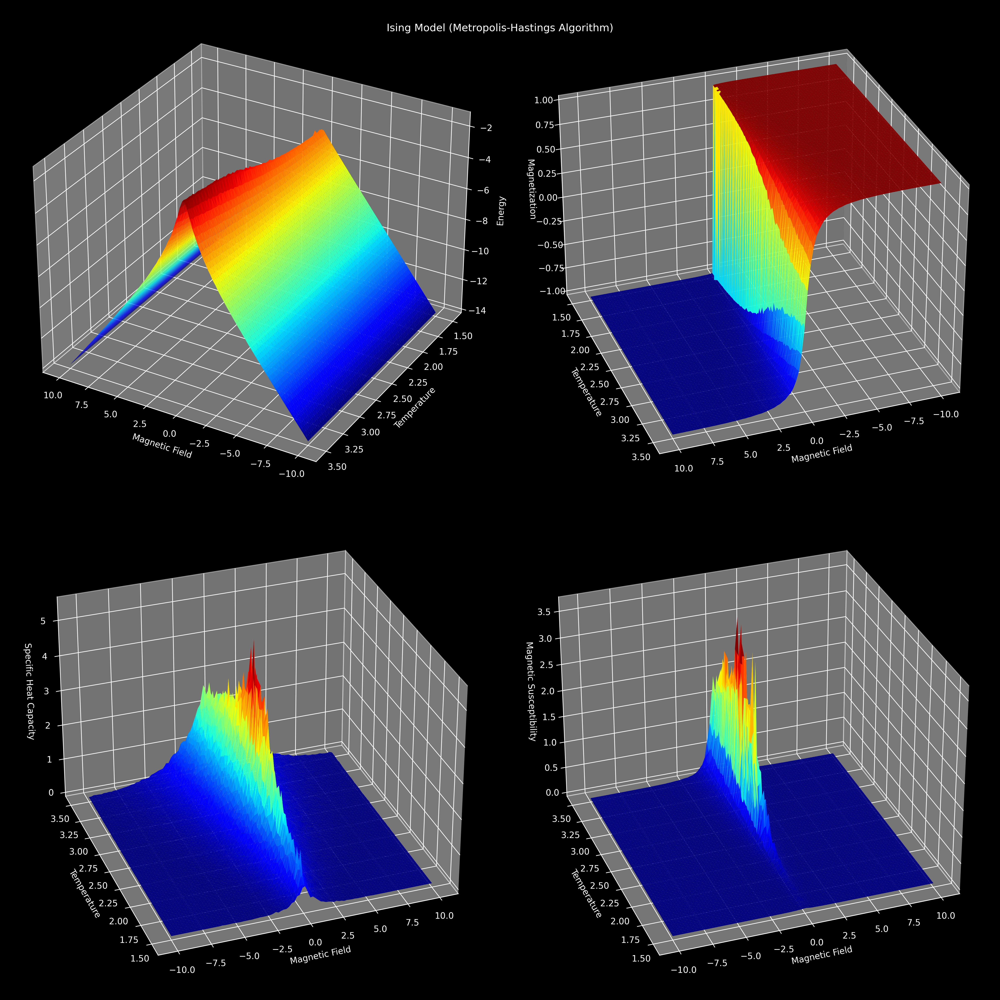

In [5]:
fig = plt.figure(figsize=(16,16), dpi=300, constrained_layout=True)
fig.suptitle('Ising Model (Metropolis-Hastings Algorithm)')

ax1 = fig.add_subplot(221, projection='3d')
ax1.view_init(30, 120)
ax1.plot_trisurf(df.MagneticField, df.Temperature, df.Energy, cmap=plt.get_cmap('jet'))
ax1.set_xlabel('Magnetic Field')
ax1.set_ylabel('Temperature')
ax1.set_zlabel('Energy')

ax2 = fig.add_subplot(222, projection='3d')
ax2.view_init(30, 70)
ax2.plot_trisurf(df.MagneticField, df.Temperature, df.Magnetization, cmap=plt.get_cmap('jet'))
ax2.set_xlabel('Magnetic Field')
ax2.set_ylabel('Temperature')
ax2.set_zlabel('Magnetization')

ax3 = fig.add_subplot(223, projection='3d')
ax3.view_init(30, -110)
ax3.plot_trisurf(df.MagneticField, df.Temperature, df.SpecificHeatCapacity, cmap=plt.get_cmap('jet'))
ax3.set_xlabel('Magnetic Field')
ax3.set_ylabel('Temperature')
ax3.set_zlabel('Specific Heat Capacity')

ax4 = fig.add_subplot(224, projection='3d')
ax4.view_init(30, -110)
ax4.plot_trisurf(df.MagneticField, df.Temperature, df.MagneticSusceptibility, cmap=plt.get_cmap('jet'))
ax4.set_xlabel('Magnetic Field')
ax4.set_ylabel('Temperature')
ax4.set_zlabel('Magnetic Susceptibility')

plt.show()

# Problem 2
Now modify your program such that it reads an additional transient duration parameter and then calculates the means of the magnetization and energy together with the standard errors of the means over a given number of MCS per spin after the transient. Plot the magnetization and energy (with errors) as a function of temperature over a range of T around TC , with magnetic field set to a very small positive value H = 0+ (this should help tame fluctuations). Set the duration   of   the   transient   and   the   number   of   MCS   per   spin   over   which   to   take   the mean/fluctuation based on your observations from (1). Note any similarities and differences between m vs T for the Ising magnet and P(p) vs p in percolation.

### IsingModel.h

```c++
#define _CRT_SECURE_NO_WARNINGS
#pragma once
#include <iomanip>
#include <random>
#include "fmt/format.h"
#include "xtensor/xarray.hpp"
#include "xtensor/xrandom.hpp"
#include "xtensor-io/xnpz.hpp"
#include "xtensor-io/ximage.hpp"


class IsingModel
{
public:
    const double J = 1.;  //Ferromagnetic Coupling Constant
    const double kB = 1.;  //Boltzmann Constant
    const double mu = 1.;  // Magnetic Moment
    const int numvars = 6;
    int rows, cols, size;
    double Tc;

    std::mt19937 rng;
    std::uniform_real_distribution<double> uniform;
    std::uniform_int_distribution<int> row_pmf;
    std::uniform_int_distribution<int> col_pmf;

    xt::xtensor<int, 2> grid{};

    IsingModel(int rows_in, int cols_in) {
        rows = rows_in;
        cols = cols_in;
        size = rows * cols;
        Tc = 2. * J / (kB * (std::log(1. + std::sqrt(2.))));
        row_pmf = std::uniform_int_distribution<int>(0, rows - 1);
        col_pmf = std::uniform_int_distribution<int>(0, cols - 1);
        grid = 2 * xt::random::randint<int>({ rows, cols }, 0, 2) - 1;
    }


    void relax(int n, double t, double h) {
        for (size_t i = 0; i < n; i++) {
            update(t, h);
        }
    }


    void reset() {
        grid = 2 * xt::random::randint<int>({ rows, cols }, 0, 2) - 1;
    }


    int metric_at(int i, int j) {
        return grid((i + 1) % rows, j) + grid((i - 1 + rows) % rows, j) + grid(i, (j + 1) % cols) + grid(i, (j - 1 + cols) % cols);
    }


    xt::xtensor<int, 2> metric() {
        return xt::roll(grid, -1, 0) + xt::roll(grid, 1, 0) + xt::roll(grid, -1, 1) + xt::roll(grid, 1, 1);
    }


    void update(double t, double h) {
        for (size_t obs = 0; obs < size; obs++) {
            int i = row_pmf(rng);
            int j = col_pmf(rng);
            double dE = 2. * (J * metric_at(i, j) - h) * grid(i, j);
            double probability = dE < 0. ? 1. : std::exp(-dE / (kB * t));
            if (uniform(rng) < probability) {
                grid(i, j) = -grid(i, j);
            }
        }
    }


    void simulate(double T_initial, double T_final, int num_T, double h_initial, double h_final, int num_h, int num_R, int num_S) {
        int line;
        int num_obs = num_T * num_h;
        double t, h;
        xt::xtensor<double, 2> dE;

        xt::xtensor<double, 2> results = xt::zeros<double>({ num_obs, numvars });
        xt::xtensor<double, 1> Trange = xt::linspace<double>(T_initial, T_final, num_T);
        xt::xtensor<double, 1> Hrange = xt::linspace<double>(h_initial, h_final, num_h);
        xt::xtensor<double, 1> Esample = xt::zeros<double>({ num_S });
        xt::xtensor<double, 1> Msample = xt::zeros<double>({ num_S });

        for (size_t t_iter = 0; t_iter < num_T; t_iter++) {
            t = Trange(t_iter);
            for (size_t h_iter = 0; h_iter < num_h; h_iter++) {
                h = Hrange(h_iter);

                line = t_iter * num_h + h_iter;
                std::cout << std::fixed << std::setprecision(2) << "\rRunning... " << 100.0 * (line + 1.0) / num_obs << "%" << std::flush;

                reset();
                relax(num_R, t, h);

                // Sample System
                for (size_t s = 0; s < num_S; s++) {
                    update(t, h);
                    dE = 2. * (J * metric() - h) * grid;
                    Esample(s) = -0.5 * xt::sum(dE)();
                    Msample(s) = xt::sum(grid)();
                }

                results(line, 0) = t;
                results(line, 1) = h;
                results(line, 2) = xt::mean(Esample)() / size;  // Energy
                results(line, 3) = xt::mean(Msample)() / size;  // Magnetization
                results(line, 4) = xt::variance(Esample)() * std::pow(t, -2.) / size;  // Specific Heat Capacity
                results(line, 5) = xt::variance(Msample)() * std::pow(t, -1.) / size;  // Magnetic Susceptibility
            }
        }
        xt::dump_npz("results.npz", "isingmodel", results, false, false);
    }


    void visualize(int frames, int skip, double t, double h) {
        for (size_t frame = 0; frame < frames; frame++) {
            std::string filename = fmt::format("frames/frame{0}.png", frame);
            xt::dump_image(filename, grid);
            relax(skip, t, h);
            std::cout << std::fixed << std::setprecision(2) << "\rRunning... " << 100.0 * (frame + 1.0) / frames << "%" << std::flush;
        }
    }
};
```

### IsingModel.cpp

```c++
#define _CRT_SECURE_NO_WARNINGS
#include <iostream>
#include <boost/program_options.hpp>
#include "IsingModel.h"

namespace opt = boost::program_options;

int main(int argc, char** argv) {
    int rows, cols, nT, nH, nR, nS, frames, skip;
    double Ti, Tf, Hi, Hf, J, mu, kB;
    bool sim, vid;

    opt::options_description params("Ising Model Parameters");

    params.add_options()
        ("help,h", "show usage")
        ("rows,r", opt::value< int >(&rows)->default_value(15), "number of rows")
        ("cols,c", opt::value< int >(&cols)->default_value(15), "number of columns")
        ("nR", opt::value< int >(&nR)->default_value(1000), "number of relaxation steps")
        ("nS", opt::value< int >(&nS)->default_value(1000), "sample size")
        ("Ti,i", opt::value<double>(&Ti)->default_value(1.5), "initial temperature")
        ("Tf", opt::value<double>(&Tf)->default_value(3.5), "final temperature")
        ("Hi", opt::value<double>(&Hi)->default_value(0.), "initial magnetic field")
        ("Hf", opt::value<double>(&Hf)->default_value(1.), "final magnetic field")
        ("nT,n", opt::value< int >(&nT)->default_value(1000), "number of time steps")
        ("nH", opt::value< int >(&nH)->default_value(1), "number of magnetic field steps")
        ("frames,f", opt::value< int >(&frames)->default_value(1000), "number of frames")
        ("skip,s", opt::value< int >(&skip)->default_value(1), "number of updates between frames")
        ("J", opt::value<double>(&J)->default_value(1.), "ferromagnetic coupling constant")
        ("kB", opt::value<double>(&kB)->default_value(1.), "Boltzmann's constant")
        ("mu", opt::value<double>(&mu)->default_value(1.), "magnetic moment")
        ("vid", opt::value<bool>(&vid)->default_value(true), "create a visualization of the relaxation algorithm")
        ("sim", opt::value<bool>(&sim)->default_value(true), "run simulation and save results to a compressed numpy (npz) file")
        ;

    opt::variables_map vm;
    opt::store(opt::parse_command_line(argc, argv, params), vm);

    if (vm.count("help")) {
        std::cout << params << std::endl;
        return 1;
    }
    else {
        opt::notify(vm);

        std::cout << "\n2D Ising Model Simulation" << std::endl;
        std::cout << "=========================" << std::endl;

        if (sim) { // sim and vid are mutually exclusive, with sim taking precedence

            std::cout << "Running Simulation:" << std::endl;
            IsingModel ising(rows, cols);
            ising.simulate(Ti, Tf, nT, Hi, Hf, nH, nR, nS);

        }
        else {
            std::cout << "Creating Visualization:" << std::endl;
            IsingModel ising(rows, cols);
            ising.visualize(frames, skip, Ti, Hi);
        }

        std::cout << "\n\nDone!" << std::endl;
        std::cout << "=========================" << std::endl;
        return 0;
    }
}
```